In [1]:
import numpy as np
import os
import random
import torch
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

/homes/e34960/anaconda3/envs/patchdiff/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
gt_images_folder = "/project/trinity/datasets/apricot/pub/apricot-mask/data_mask_v2"
gt_images_names = os.listdir(gt_images_folder)

print(len(gt_images_names))

873


In [4]:
def getRandomImages(n=1):
    random_numbers = random.sample(range(0, len(gt_images_names)-1), n)

    imgs = []
    for i in range(n):
        # idx = random.randint(0,len(gt_images_names)-1)
        img_info = torch.load(os.path.join(gt_images_folder, gt_images_names[random_numbers[i]]))
        img = np.squeeze(img_info['Image'])
        imgs.append(img)

    return imgs

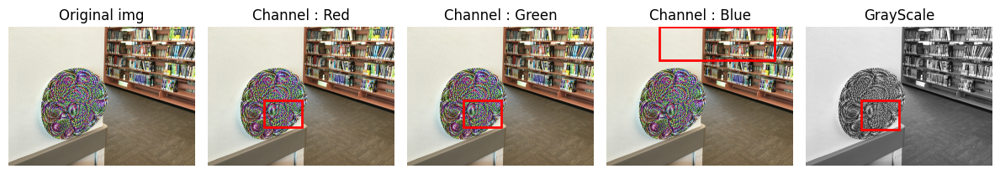

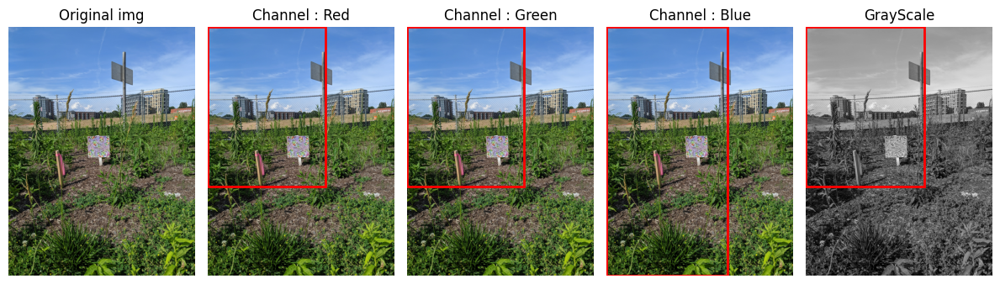

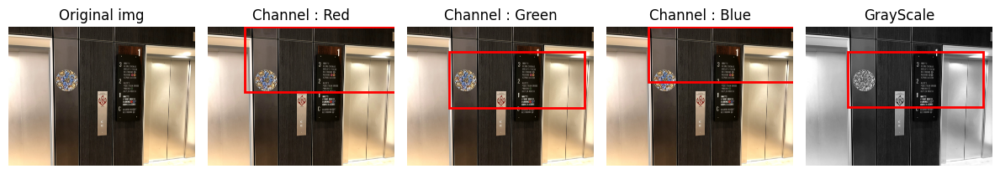

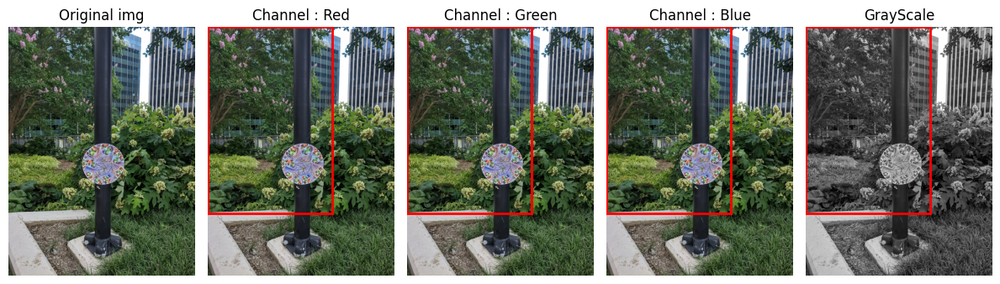

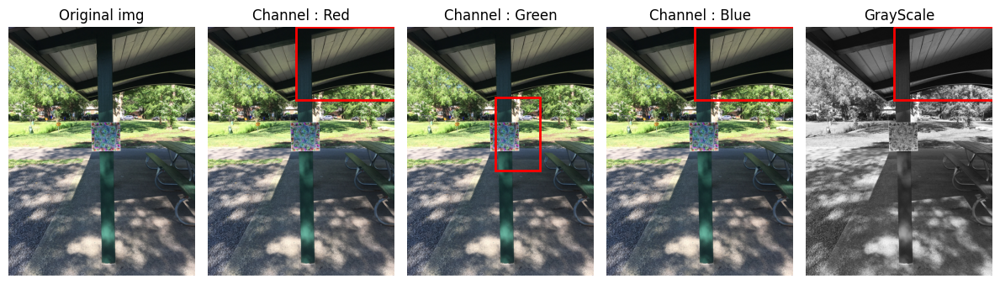

...

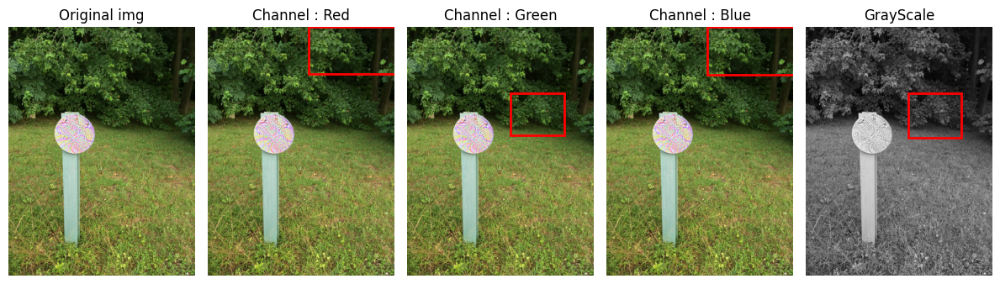

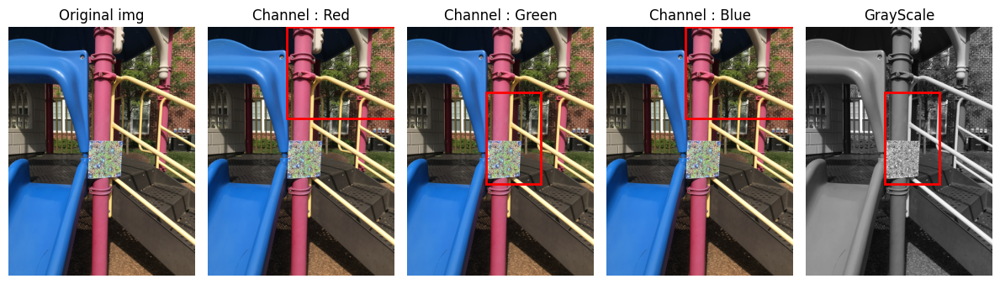

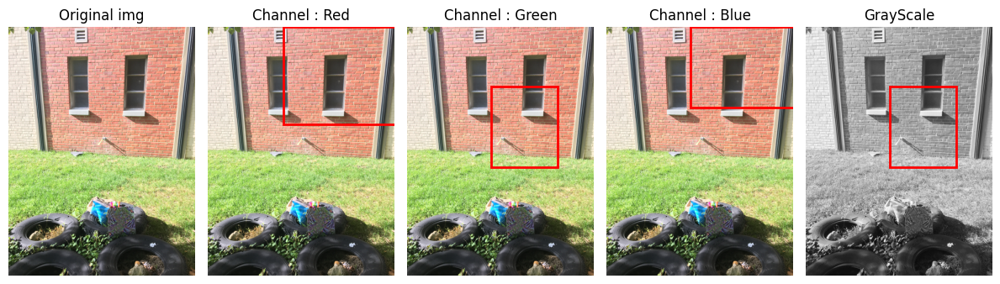

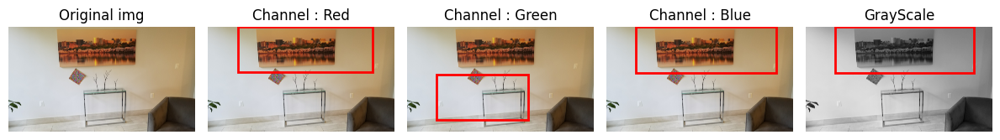

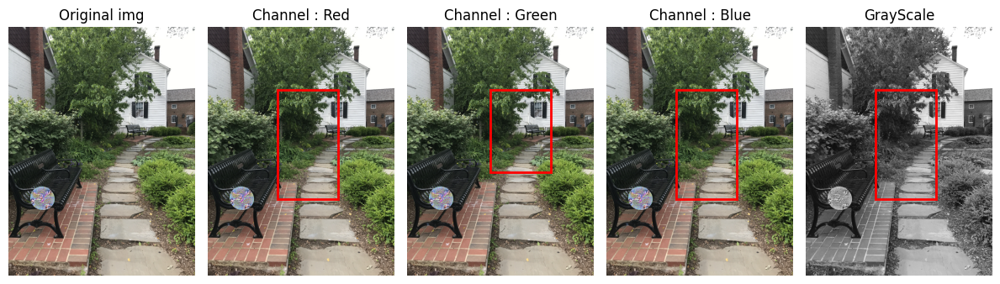

In [5]:
num_images = 50
img_list = getRandomImages(num_images)

channels = ['Red', 'Green', 'Blue']
threshold_value = 99.5

for i in range(num_images):
    # Compute the FFT of each color channel
    channel_fft = np.fft.fftshift(np.fft.fft2(img_list[i], axes=(0, 1)), axes=(0, 1))

    # Compute the magnitude spectrum for each channel
    magnitude_spectrum = np.abs(channel_fft)

    fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(12, 20))
    axes[0].imshow(img_list[i])
    axes[0].set_title('Original img')
    axes[0].axis('off')

    for j in range(3):
        ch_mag_spectrum = magnitude_spectrum[:,:,j]
        # Threshold value for identifying high-frequency regions
        threshold = np.percentile(ch_mag_spectrum, threshold_value)

        # Create a binary mask to identify the high-frequency patch region
        high_freq_mask = ch_mag_spectrum >= threshold

        # Find the bounding box of the high-frequency patch region
        rows, cols = np.nonzero(high_freq_mask)
        top_row, bottom_row = np.min(rows), np.max(rows)
        left_col, right_col = np.min(cols), np.max(cols)
        # print(top_row, bottom_row, left_col, right_col)

        # Display the high-frequency patch region
        rectangle = patches.Rectangle((top_row, left_col), right_col - left_col, bottom_row - top_row, linewidth=2, edgecolor='r', facecolor='none')

        axes[j+1].imshow(img_list[i])
        axes[j+1].add_patch(rectangle)
        axes[j+1].set_title('Channel : {}'.format(channels[j]))
        axes[j+1].axis('off')

    gray_scale = cv2.cvtColor(img_list[i], cv2.COLOR_BGR2GRAY)
    fft = np.fft.fftshift(np.fft.fft2(gray_scale))
    magnitude_spectrum = np.abs(fft)
    threshold = np.percentile(magnitude_spectrum, threshold_value)
    high_freq_mask = magnitude_spectrum >= threshold

    rows, cols = np.nonzero(high_freq_mask)
    top_row, bottom_row = np.min(rows), np.max(rows)
    left_col, right_col = np.min(cols), np.max(cols)

    rectangle = patches.Rectangle((top_row, left_col), right_col - left_col, bottom_row - top_row, linewidth=2, edgecolor='r', facecolor='none')

    axes[4].imshow(gray_scale, cmap='gray')
    axes[4].add_patch(rectangle)
    axes[4].set_title('GrayScale')
    axes[4].axis('off')

    plt.tight_layout()
    plt.show()
